<a href="https://colab.research.google.com/github/grojasc/MIA/blob/main/IMT3870_Gonzalo_Rojas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IMT3870 Tarea 1: Gonzalo Rojas


### Introducción
Una tarea común de aprendizaje automatizado no-supervisado es buscar grupos de registros similares en grandes volúmenes de datos, llamado conglomeraciones o clústers (no hay que confundir con un ‘clúster’ de computadores).
En esta tarea programamos el algoritmo de k-medias. Este algoritmo se puede
describir con los pasos siguientes:


---
```
1. Importar o generar n registros de m dimensiones cada uno.
2. Inicializar el algoritmo.
  >a. Elegir el valor de k.

  >b. Elegir k centros iniciales en el espacio.
3. Algoritmo recursivo para mejorar conglomeraciones.
  >a. Asignar a cada registro la etiqueta del centro mas cercano.

  >b. Calcular los nuevos centros como el centro de masa de
  >las conglomeraciones.

  >c. Iterar hasta las conglomeraciones ya no cambien.
```


---




## Importar Librerías

In [108]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import style
import pandas as pd
import joblib
from scipy.spatial.distance import cdist
from scipy.spatial.distance import euclidean
from joblib import Parallel, delayed
from joblib import cpu_count

## Preguntas

1. Generen los datos para la conglomeración. La dimensión de los puntos debe ser a menos dos (2D) y el número de registros a menos un mil. Para generar los datos aleatoriamente, se puede usar, por ejemplo, numpy.random o sklearn.datasets.make_blobs.

In [126]:
np.random.seed(0)
n = 1000
m = 2
itermax = 100
cong = np.random.rand(n, m)
cong.shape
cong


array([[0.5488135 , 0.71518937],
       [0.60276338, 0.54488318],
       [0.4236548 , 0.64589411],
       ...,
       [0.41443887, 0.79128155],
       [0.72119811, 0.48010781],
       [0.64386404, 0.50177313]])

2. Inicializen el algoritmo, eligiendo el valor de k (lo cual debe ser a menos tres) y los centros iniciales.

In [49]:
k = 5

3. Implementen el algoritmo de k-medias en las siguientes variantes. Para
esta parte, no se puede usar sklearn.



---


> a) Python loops. Todos las iteraciones de k-medias y el cálculo de
distancias, sumas, vectores, etc. deben ser programados con bucles
en Python. En específico, la asignación (paso 3a del algoritmo)
debe ser dos bucles sobre los registros y los centros; y el update
(paso 3b) un bucle sobre los registros. No pueden usar funciones
de Numpy sobre vectores, solo sobre un único número, por ejemplo,
np.sqrt(x) para x un número y no un arreglo.

> b) NumPy. Vectorizen el algoritmo, es decir, usen funciones vectoriales de NumPy o SciPy, tales como normas, distancias y sumas de
vectores. Al final, no deben tener bucles (tampoco list comprehension) sobre los registros de la base de datos. Se puede usar bucles
sobre los centros.
Sugerencia: la función scipy.spatial.distance.cdist podría
ser util.

> c) Multiprocessing. Usen la librería joblib para paralelizar el código
de Python en distintos procesos (multiprocessing, no multithreading). En esta tarea, es suficiente paralelizar la asignación (paso
3a) sobre los registros de la base de datos. Para el update (paso
3b) se puede usar NumPy






In [127]:
### Iniciar Centroides
#for c in range(k):
#    centers[c,0] = float(c+1)/(k+1)
#    centers[c,1] = 0.5
    
def iniciar_centroides(k,cong):
  #np.random.seed(0)
  centros = np.zeros([k,m])
  for k in range(k):
    centroide = cong[np.random.choice(range(n))]
    centros[k] = centroide
  return centros

centros = iniciar_centroides(k,cong)

centros

array([[0.24002027, 0.16053882],
       [0.20279604, 0.42358764],
       [0.64429863, 0.71429985],
       [0.67168986, 0.47032128],
       [0.69395641, 0.09088573]])

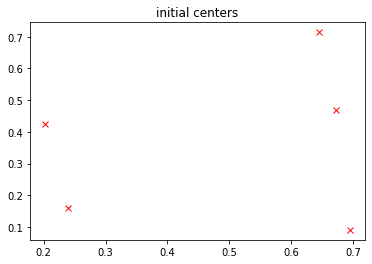

In [128]:
plt.plot(centros[:,0], centros[:,1], 'rx')
#plt.xlim([0,1])
#plt.ylim([0,1])
plt.title('initial centers')
plt.show()

###**3a) Python loops**

In [157]:
%%time
# OPCIÓN PYTHON LOOPS

history_of_centers = [centros]
history_of_clusters = []

for iteration in range(itermax):
    
    old_centers = history_of_centers[-1]

    # assignment step
    cluster = np.zeros(n, dtype='int')
    for p in range(n):
        minimum_distance = np.inf
        nearest_cluster = None
        for c in range(k):
            distance_to_cluster_c = np.sqrt((cong[p,0] - old_centers[c,0])**2 + (cong[p,1] - old_centers[c,1])**2)
            if distance_to_cluster_c < minimum_distance:
                minimum_distance = distance_to_cluster_c
                nearest_cluster = c
        cluster[p] = nearest_cluster
    history_of_clusters.append(cluster)
    #print(cluster.shape)
    # check convergence
    if iteration > 0:
        clusters_changed = False
        for p in range(n):
            if history_of_clusters[-1][p] != history_of_clusters[-2][p]:
                clusters_changed = True
        if not clusters_changed:
            print("Converged in", iteration, "iterations.\n")
            break

    # update step
    number_of_points_in_cluster = np.zeros(k, dtype='int')
    sum_of_locations = np.zeros([k, 2], dtype='float')
    for p in range(n):
        number_of_points_in_cluster[cluster[p]] += 1
        sum_of_locations[cluster[p], :] += cong[p, :]
    new_centers = np.zeros([k, 2], dtype='float')
    for c in range(k):
        new_centers[c,0] = sum_of_locations[c,0] / number_of_points_in_cluster[c]
        new_centers[c,1] = sum_of_locations[c,1] / number_of_points_in_cluster[c]
    history_of_centers.append(new_centers)


Converged in 12 iterations.

CPU times: user 252 ms, sys: 2.92 ms, total: 254 ms
Wall time: 255 ms


###**3b) NUMPY**

In [102]:
%%time
history_of_centers = [centros]
history_of_clusters = []
#centers = centros
for iteration in range(itermax):
  old_centers = history_of_centers[-1]
  # assignment step
  cluster = np.full((n,1), 0)     #np.zeros(n, dtype='int')
  total_dist = np.full((n,0), 0) 
  cong1 = np.zeros([n,m+1], dtype='float')
  #centers = new_centers
  for c in range(k):
    centroid = np.full((1,m), old_centers[c])
    distance_to_cluster_c = cdist(cong,centroid)
    total_dist = np.append(total_dist, distance_to_cluster_c, axis=1)  
    #print(centroid,distance_to_cluster_c,total_dist,cong)
  cluster = np.argmin(total_dist, axis=1)
  cluster = np.reshape(cluster, (n,1))
  total_dist = np.append(total_dist, cluster, axis=1)
  history_of_clusters.append(cluster)
  
  cong1 = np.append(cong, cluster, axis=1) 
  new_centers = np.zeros([k, m], dtype='float')
  #print(total_dist)
  #print(cong1)#old_centers,new_centers, cong1)
  f = []
  g = []
    #print(unique, counts,count_array)
  for c in range(k):
    #index = np.where(cong1[:,2] == c, cong1[:,0], 0)
    #arr = np.delete(arr, index)
    #x = [np.count(cong1[:,2] == c, c)]
    cc =  np.count_nonzero(cong1[:,2] == c)
    h = np.sum(np.where(cong1[:,2] == c, cong1[:,0], 0),axis=0)
    i = np.sum(np.where(cong1[:,2] == c, cong1[:,1], 0),axis=0)
    f.append(h/cc)
    g.append(i/cc)
    #print(h,i,cc,f,g,c)
  center_x = np.asarray(f)
  center_y = np.asarray(g)
  center_x = center_x.reshape(5,1)
  center_y = center_y.reshape(5,1)
  new_centers = np.append(center_x,center_y, axis = 1)
  history_of_centers.append(new_centers)

CPU times: user 73.9 ms, sys: 1.51 ms, total: 75.4 ms
Wall time: 80.5 ms


###**3c) Multiprocessing**

In [138]:
print("Number of cores found by joblib:", cpu_count())

Number of cores found by joblib: 2


In [129]:
def assigment_step (cong,n,k,centros):
  old_centers = centros[-1]
  cluster = np.zeros(n, dtype='int')
  for p in range(n):
    minimum_distance = np.inf
    nearest_cluster = None
    for c in range(k):
      distance_to_cluster_c = np.sqrt((cong[p,0] - old_centers[c,0])**2 + (cong[p,1] - old_centers[c,1])**2)
      if distance_to_cluster_c < minimum_distance:
        minimum_distance = distance_to_cluster_c
        nearest_cluster = c
    cluster[p] = nearest_cluster
  return cluster

In [153]:
n_workers = 1
history_of_centers = [centros]
tasks = [delayed(assigment_step)(cong,n,k,history_of_centers) for i in range(n_workers)]

In [159]:
%%time
# OPCIÓN C JOBLIB
history_of_clusters = []

for iteration in range(itermax):
    
    old_centers = history_of_centers[-1]

    # assignment step
    with Parallel(n_jobs=n_workers, batch_size=1, verbose=0, backend='loky') as parallel_pool:
      parallel_results = parallel_pool(tasks)
      

    history_of_clusters.append(parallel_results)
    
    #history_of_clusters = np.vstack(history_of_clusters) 
    
   
    # update step
       
    #cluster = np.argmin(total_dist, axis=1)
    cluster = np.reshape(cluster, (n,1))
    #total_dist = np.append(total_dist, cluster, axis=1)  
    #history_of_clusters.append(cluster)
    #print(total_dist[10],total_dist[10])
    new_centers = np.zeros([k, m], dtype='float')
    cong1 = np.append(cong, cluster, axis=1) 
    f = []
    g = []
    for c in range(k):
    #index = np.where(cong1[:,2] == c, cong1[:,0], 0)
    #arr = np.delete(arr, index)
    #x = [np.count(cong1[:,2] == c, c)]
      cc =  np.count_nonzero(cong1[:,2] == c)
      h = np.sum(np.where(cong1[:,2] == c, cong1[:,0], 0),axis=0)
      i = np.sum(np.where(cong1[:,2] == c, cong1[:,1], 0),axis=0)
      f.append(h/cc)
      g.append(i/cc)
    #print(h,i,cc,f,g,c)
    center_x = np.asarray(f)
    center_y = np.asarray(g)
    center_x = center_x.reshape(k,1)
    center_y = center_y.reshape(k,1)
    new_centers = np.append(center_x,center_y, axis = 1)
    history_of_centers.append(new_centers)


CPU times: user 1.56 s, sys: 397 µs, total: 1.56 s
Wall time: 1.57 s


In [155]:
def get_number_of_elements(list):
    count = 0
    for element in list:
        count += 1
    return count

print("Number of elements in the list: ", get_number_of_elements(history_of_clusters))

Number of elements in the list:  100


In [120]:
my_global_var = 1.4
def return_global_var():
    return my_global_var
n_workers = 2
tasks = [delayed(return_global_var)() for i in range(n_workers)]
with Parallel(n_jobs=n_workers, batch_size=1, verbose=10, backend='loky') as parallel_pool:
    parallel_results = parallel_pool(tasks)
print(parallel_results)

[1.4, 1.4]


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=2)]: Done   2 out of   2 | elapsed:    0.0s finished


In [115]:
print("Number of cores found by joblib:", cpu_count())
parallel_pool = Parallel(n_jobs=4)
print("The number of workers is:", parallel_pool.n_jobs)
n_tasks = 100000
tasks = [delayed(np.sqrt)(i) for i in range(n_tasks)]
n_workers = 2
with Parallel(n_jobs=n_workers, verbose=10,batch_size=1000,backend='loky') as parallel_pool:
    parallel_results = parallel_pool(tasks)

Number of cores found by joblib: 2
The number of workers is: 4


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done 1004 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 4004 tasks      | elapsed:    0.2s
[Parallel(n_jobs=2)]: Done 9004 tasks      | elapsed:    0.4s
[Parallel(n_jobs=2)]: Done 14004 tasks      | elapsed:    0.5s
[Parallel(n_jobs=2)]: Done 21004 tasks      | elapsed:    0.8s
[Parallel(n_jobs=2)]: Done 28004 tasks      | elapsed:    1.0s
[Parallel(n_jobs=2)]: Done 37004 tasks      | elapsed:    1.3s
[Parallel(n_jobs=2)]: Done 46004 tasks      | elapsed:    1.6s
[Parallel(n_jobs=2)]: Done 57004 tasks      | elapsed:    2.0s
[Parallel(n_jobs=2)]: Done 68004 tasks      | elapsed:    2.4s
[Parallel(n_jobs=2)]: Done 81004 tasks      | elapsed:    2.8s
[Parallel(n_jobs=2)]: Done 94004 tasks      | elapsed:    3.3s
[Parallel(n_jobs=2)]: Done 99093 tasks      | elapsed:    3.5s
[Parallel(n_jobs=2)]: Done 100000 out of 100000 | elapsed:    3.6s finished


### 4) Miden el tiempo de cómputo de cada implementación. 
Asegúrense quela base de datos es suficientemente grande para ver diferencias en el tiempo de cómputo. Observen cuantos procesos y cuantos hilos Python
está usando en tu computador. Escriben un informe corto en lo cual
explican los resultados. Puede ser en formato PDF o en un Jupyter
Notebook. En específico, responden las preguntas siguientes.


**Procesador del computador utilizado**

-**4 Núcleos y 8 subprocesos**

-**1,99 GHz**

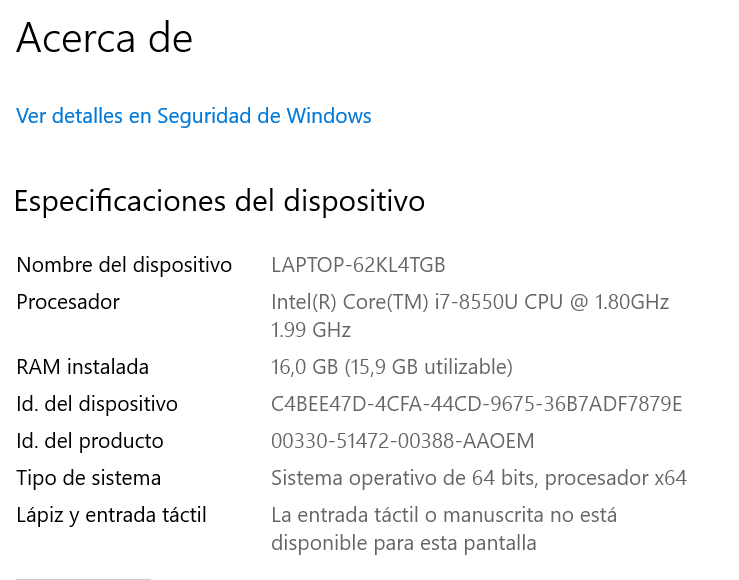

####¿Cuál es la diferencia en tiempo de cómputo entre las tres variantes? Expliquen por qué son diferentes.


#### ¿Cuál es la diferencia en tiempo de cómputo con distintos números de procesos en joblib? Expliquen por qué son diferentes.

### 5. Finalmente, visualizen las conglomeraciones en un scatter plot. 
Si usaron mas dimensiones que dos, hay que reducir la dimensionalidad (se
puede usar sklearn para este).
Sugerencia: se puede hacer algo como
plt.scatter(dataset[:,0], dataset[:,1], c=cluster) para dibujar conglomeraciones.

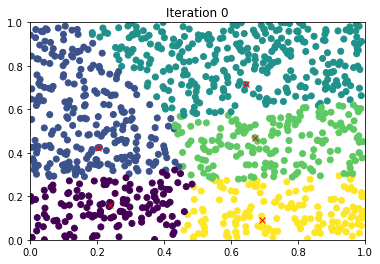

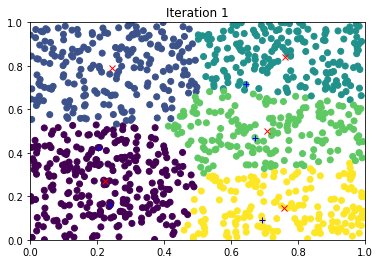

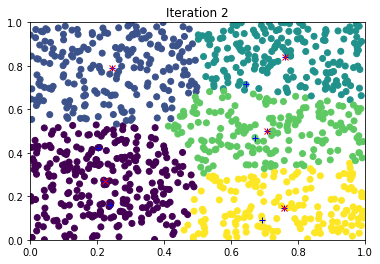

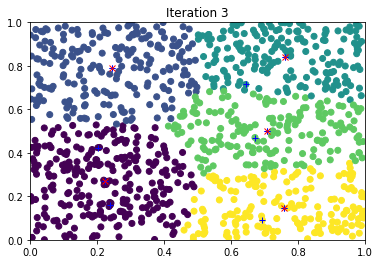

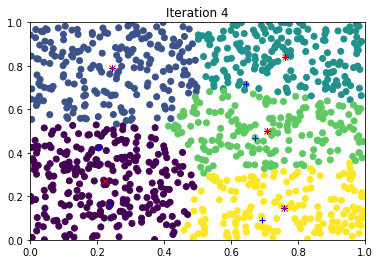

...

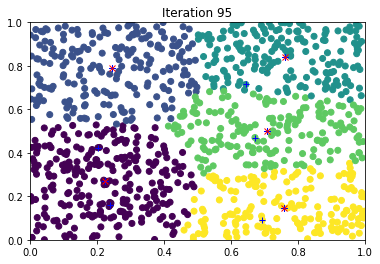

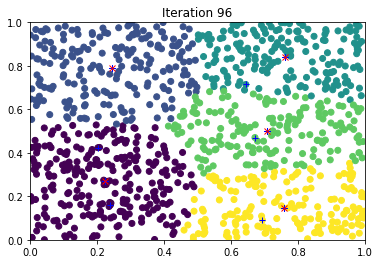

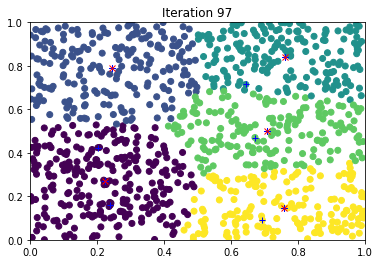

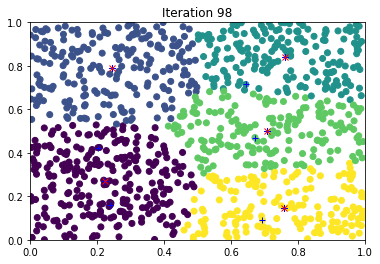

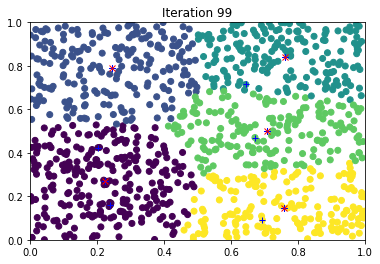

In [156]:
for itr in range(iteration+1):
    plt.scatter(cong[:,0], cong[:,1], c=history_of_clusters[itr])
    for l in range(itr):
        plt.plot(history_of_centers[l][:,0], history_of_centers[l][:,1], 'b+')
    plt.plot(history_of_centers[itr][:,0], history_of_centers[itr][:,1], 'rx')
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.title("Iteration "+str(itr))
    plt.show()